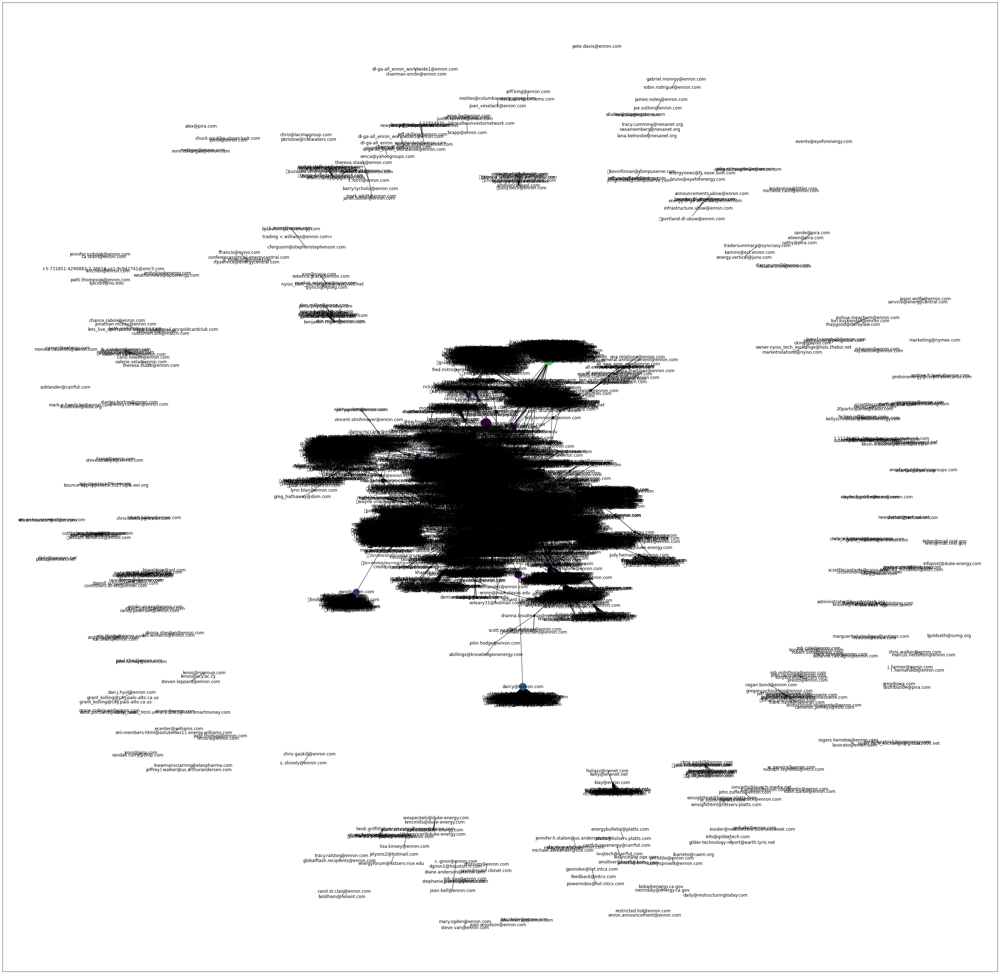

In [2]:
import csv
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd


def wordFromCSV(src, word):
    """Create a dataframe of the mails containing the target word.
    
    Args:
        src(csv): source of mails to explore.
        word(str): target word to find.

    Returns:
        df:dataframe
    """
    csv.field_size_limit(100000000)
    data=[]
    target=word.lower()

    with open(src, 'r') as csvfile:
        mails = csv.reader(csvfile, delimiter='|')
        for message in mails:
            body_message=message[7].lower()
            if body_message.__contains__(target)==True:
                temp=[
                    message[1],
                    message[2],
                    message[3],
                    message[4],
                    message[5],
                    message[6],
                    message[7]]
                    
                data.append(temp)
                df = pd.DataFrame(data, columns=['Date',  'From',  'To', 'Cc',  'Bcc',  'Subject', 'Body']) 

    return df

# Create the graph
G_symmetric = nx.Graph()

df2 = wordFromCSV('sample.csv', 'energy')

for index, mail in df2.iterrows():
    mail_to=mail[2].split(sep=",")

    for adress in mail_to:
        G_symmetric.add_edge(mail[1],adress,weight=1)


pos = nx.spring_layout(G_symmetric)
betCent = nx.betweenness_centrality(G_symmetric, normalized=True, endpoints=True)
node_color = [20000.0 * G_symmetric.degree(v) for v in G_symmetric]
node_size =  [v * 10000 for v in betCent.values()]
plt.figure(figsize=(50, 50))
nx.draw_networkx(G_symmetric, pos=pos, with_labels=True,
                 node_color=node_color,
                 node_size=node_size )